# Сборный проект-4 "Поиск изображений по запросу"

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/......._project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 0. Вспомогательные функции и инициализация

In [ ]:
RANDOM_STATE = 42
DATASET_LIMIT = 0 # set 0 if no limits
COLAB = True

DATA_PATH = "/content/drive/MyDrive/ydsc/pills_project/" if COLAB else "./"


In [ ]:
import os
import time
import pandas as pd
import numpy as np
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler
import re
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image

from transformers import BertTokenizer, BertModel

from torch.utils.data import DataLoader, Dataset, TensorDataset
import torch.optim as optim

from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression

from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, PredefinedSplit

In [ ]:
if COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


Визуально качество экспертной оценки проверено (по именам файло

### Загрузка таблиц

In [ ]:
def load_df (path, delimiter=',', colmuns=None):
    df = pd.read_csv(path, delimiter=delimiter, names=colmuns)
    display (df.info())
    display (df.head(3))
    return df

In [ ]:
train_df = load_df (os.path.join(DATA_PATH, 'train_dataset.csv'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


None

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [ ]:
experts_df = load_df (os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), delimiter='\t',
                    colmuns=['image', 'query_id', 'expert_1', 'expert_2',
                             'expert_3'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


None

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2


In [ ]:
crowd_df = load_df (os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), delimiter='\t',
                    colmuns=['image', 'query_id', 'portion', 'correct_cnt',
                             'incorrect_cnt'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   portion        47830 non-null  float64
 3   correct_cnt    47830 non-null  int64  
 4   incorrect_cnt  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


None

,image,query_id,portion,correct_cnt,incorrect_cnt
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3


In [ ]:
test_images_df = load_df (os.path.join(DATA_PATH, 'test_images.csv'))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


None

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg


In [ ]:
test_queries_df = load_df (os.path.join(DATA_PATH, 'test_queries.csv'), delimiter='|')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


None

,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg


### Исследование таблиц

Количество уникальных изображений в обучающем наборе:

In [ ]:
train_df['query_id'].nunique()

977

Количество уникальных изображений в тестовом наборе:

In [ ]:
test_queries_df['image'].nunique()

100

Количество уникальных запросов в обучающем наборе:  

In [ ]:
train_df['query_text'].nunique()

977

Количество уникальных запросов в обучающем наборе:  

In [ ]:
test_queries_df['query_text'].nunique()

500

Количество оценок в экспертном наборе:

In [ ]:
experts_voices_cnt =  experts_df['expert_1'].count() \
    + experts_df['expert_2'].count() + experts_df['expert_3'].count()
experts_voices_cnt

np.int64(17466)

Количество оценок в краудсорсинговом наборах:

In [ ]:
crowd_voices_cnt = crowd_df['correct_cnt'].count() + crowd_df['incorrect_cnt'].count()
crowd_voices_cnt

np.int64(95660)

Что представляют из себя экспертные оценки:

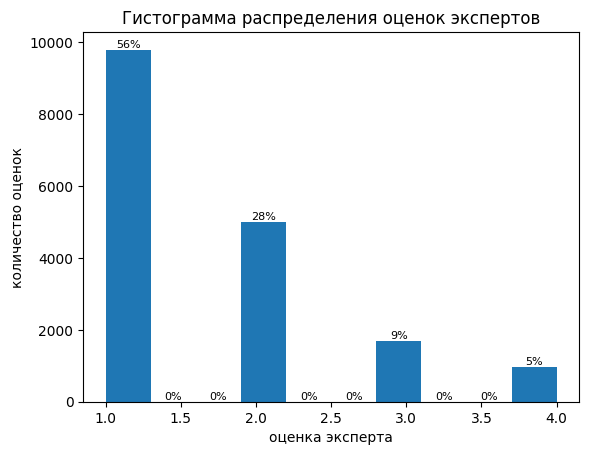

In [ ]:
experts_sast = pd.concat([experts_df['expert_1'], experts_df['expert_2'], experts_df['expert_3']])
counts, bin_edges, patches = plt.hist(experts_sast)
plt.xlabel('оценка эксперта')
plt.ylabel('количество оценок')
plt.title('Гистограмма распределения оценок экспертов')
for count, x in zip(counts, bin_edges[:-1]):
    plt.text(x + (bin_edges[1] - bin_edges[0]) / 2, count + 1,
             str(int(count*100/experts_voices_cnt))+'%',
             ha='center', va='bottom', fontsize=8)
plt.show()

Что представляют из себя краудсорсинговом оценки:

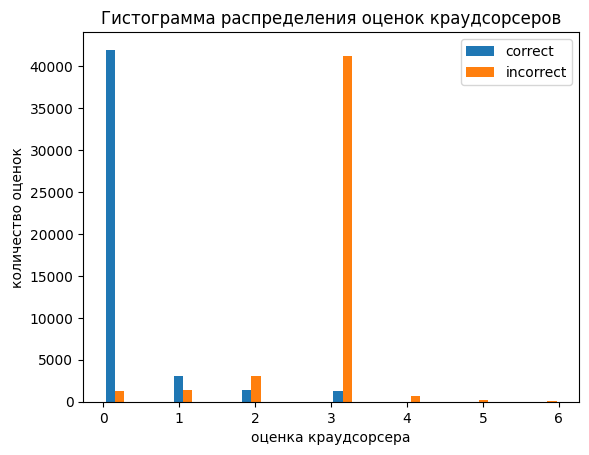

In [ ]:
crowd_sast = crowd_df['portion']
counts, bin_edges, patches = plt.hist( \
    [crowd_df['correct_cnt'], crowd_df['incorrect_cnt']],
    label=['correct', 'incorrect'],
    bins=20)
plt.xlabel('оценка краудсорсера')
plt.ylabel('количество оценок')
plt.title('Гистограмма распределения оценок краудсорсеров')
plt.legend()
plt.show()

Посмотрим на некоторые изображения с высокой оценкой экспертов

In [ ]:
def show_img_examples (df, smpl_cnt, tr_df):
    for _, row in df.sample(smpl_cnt).iterrows():
        query_id = row['query_id']
        img_name = row['image']
        train_row = tr_df.query (f'query_id=="{query_id}"').head(1)

        img = Image.open(os.path.join(DATA_PATH, 'train_images/', img_name))
        plt.imshow(img)
        plt.axis('off')
        plt.title(train_row['query_text'].values[0])
        plt.show();

Требуется соотнести оценки экспертов и краудсорсеров. В случае когда все эксперты или все краудсорсеров единогласно за или против соответствия описания изображению - скорее всего всё в порядке, поэтому сравним долю ошибок экспертов с долей ошибок краудсорсеров на неуверенных диапазонах оценок ("около 2-3" в случае экспертов и "много за и много против" в случае краудсорсеров).

Однако прежде убедимся, что первая гипотеза о коррекности оценок при консенсусе - верна:

высокие оценки от всех экспертов:

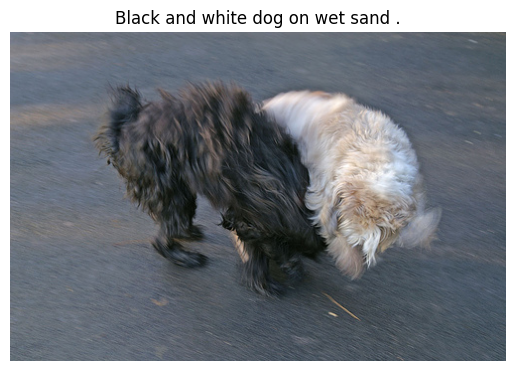

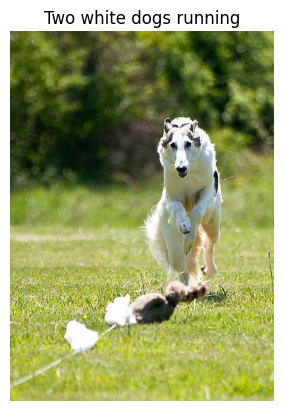

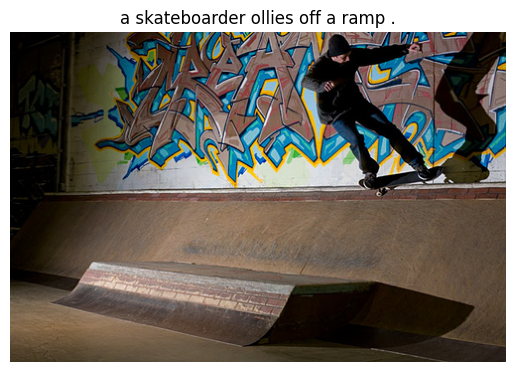

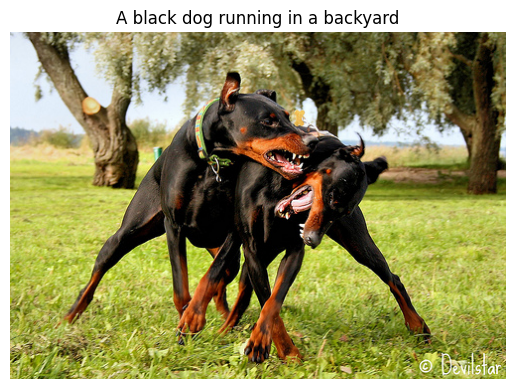

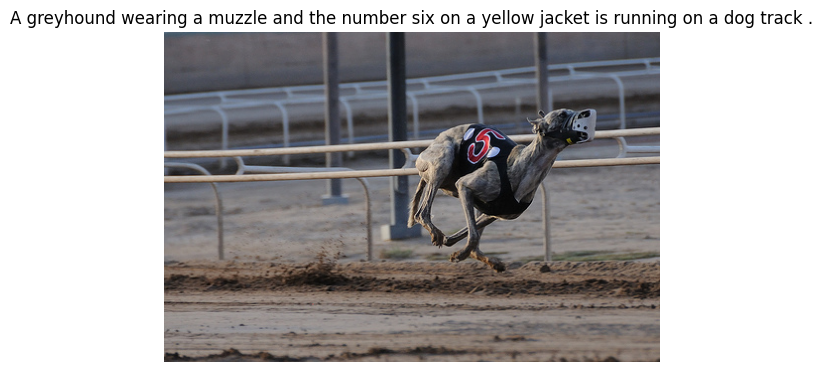

In [ ]:
confident_experts_voices_pos = experts_df.query ('expert_1>=3 and expert_2>=3 and expert_3>=3')
show_img_examples(confident_experts_voices_pos, 5, train_df)

низкие оценки от всех экспертов:

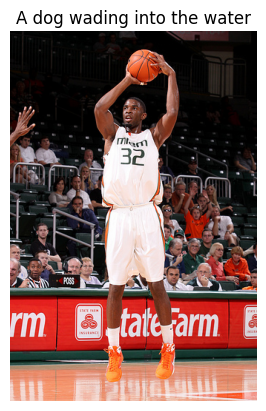

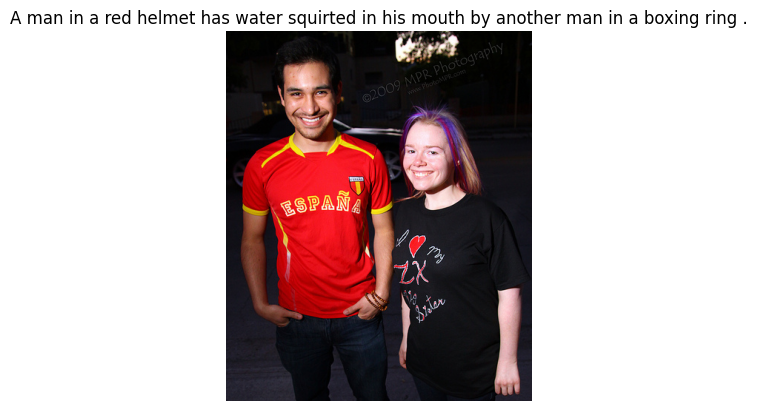

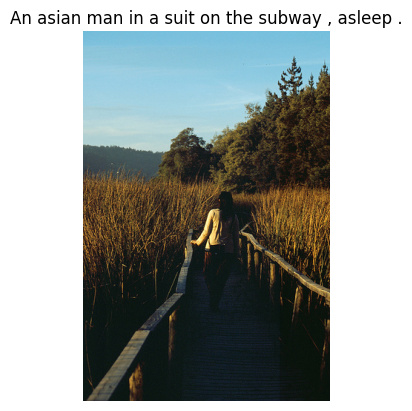

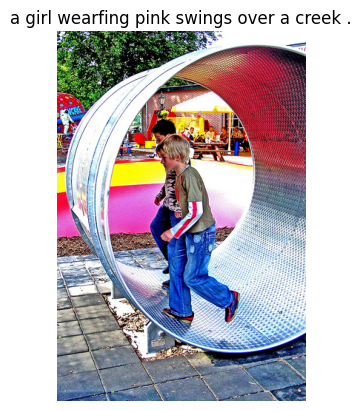

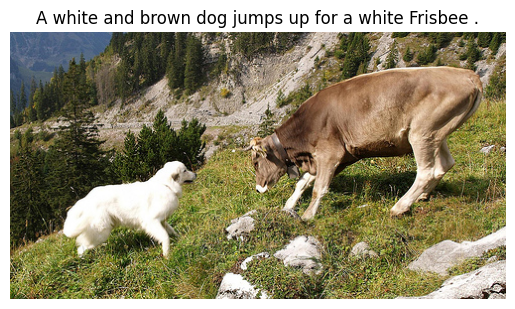

In [ ]:
confident_experts_voices_neg = experts_df.query ('expert_1<=2 and expert_2<=2 and expert_3<=2')
show_img_examples(confident_experts_voices_neg, 5, train_df)

высокие оценки от краудсорсеров:

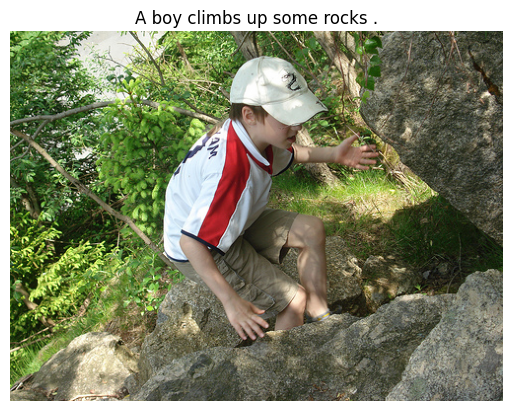

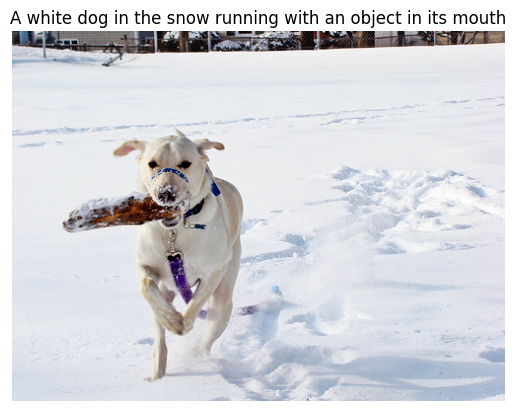

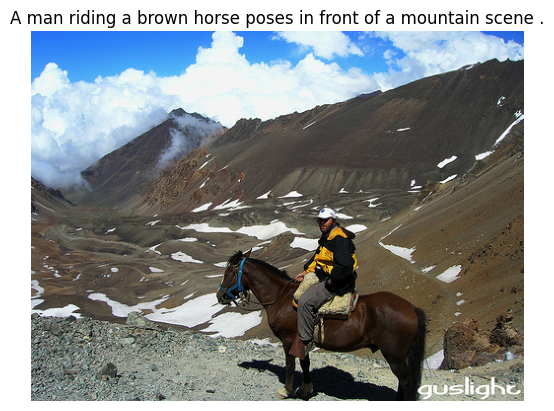

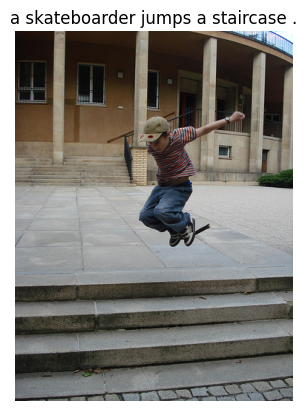

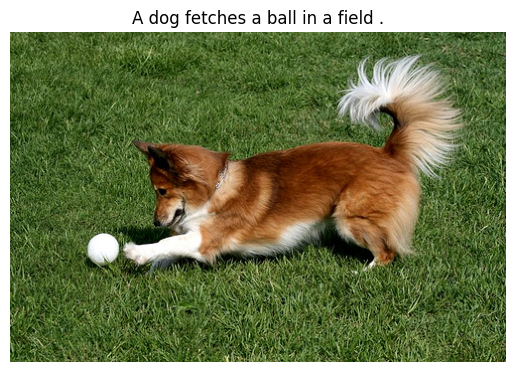

In [ ]:
confident_crowd_voices_pos = crowd_df.query ('correct_cnt>=3 and incorrect_cnt<=1')
show_img_examples(confident_crowd_voices_pos, 5, train_df)

низкие оценки от краудсорсеров:

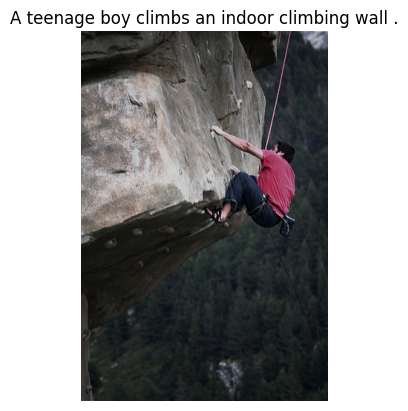

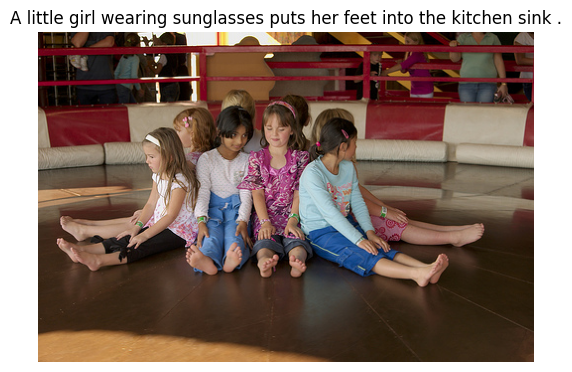

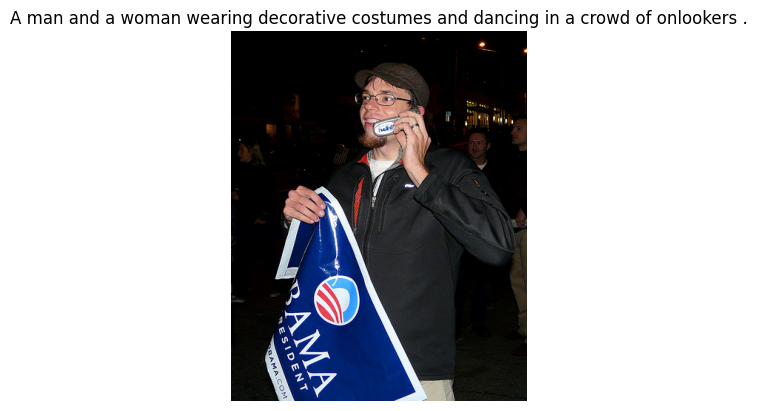

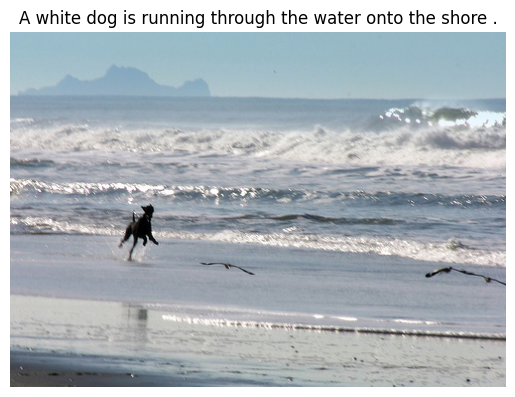

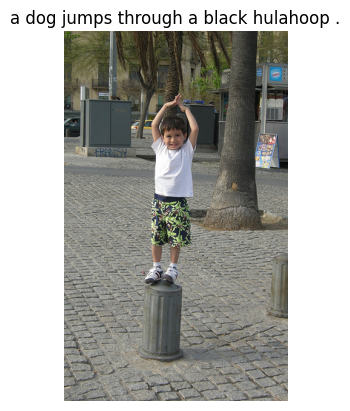

In [ ]:
confident_crowd_voices_neg = crowd_df.query ('incorrect_cnt>=3 and correct_cnt<=1')
show_img_examples(confident_crowd_voices_neg, 5, train_df)

Да, как видно из примеров выше, при консенсусе экспертов или краудсорсеров - проблем нет, качества оценок высокое.

Cколько уверенных (предположительно, высококачественных) высоких оценок:

In [ ]:
confident_crowd_voices_pos.shape[0] + confident_experts_voices_pos.shape[0]

1929

Это лишь 11% от экспертных оценок. Просто выбросить остальные 89%, значит, мы не можем.

Cколько уверенных (предположительно, высококачественных) низких оценок:

In [ ]:
confident_crowd_voices_neg.shape[0] + confident_experts_voices_neg.shape[0]

46663

Это лишь 49% от каудсорсинговых оценок. Просто выбросить остальные 51%, значит, мы не можем.

Посомтрим, как соотносятся доли ошибок в неуверенных оценках краудсорсеров и экспертов:

Противоречивые оценки экспертов (это середина между 1 и 4, а после нормирования это будет 0.5 - значит небольшая окрестность вокруг 0.5 - это зона неуверенности экспертов):

In [ ]:
experts_df ['mean'] = ( experts_df[['expert_1', 'expert_2', 'expert_3']].mean(axis=1) - 1 ) / 3

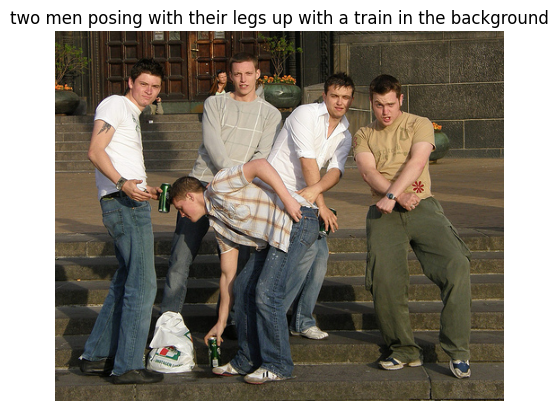

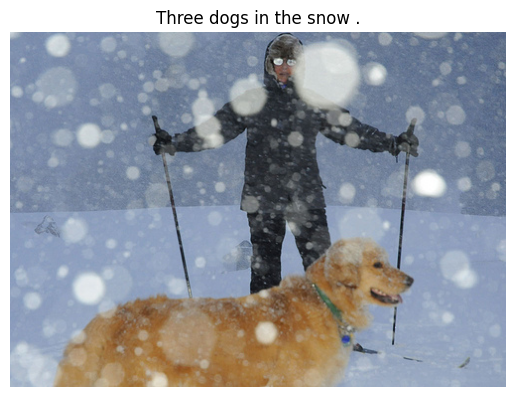

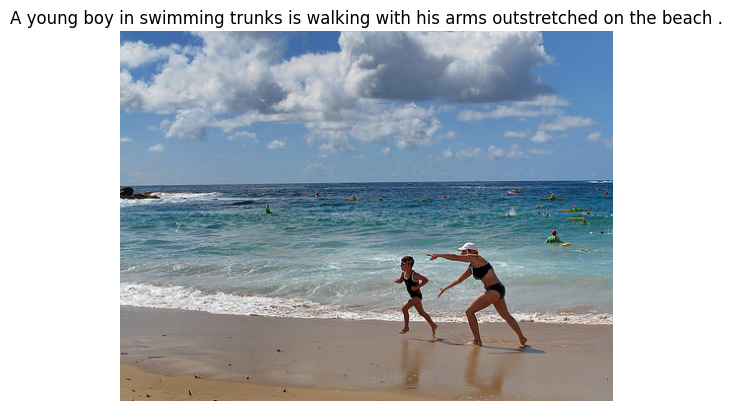

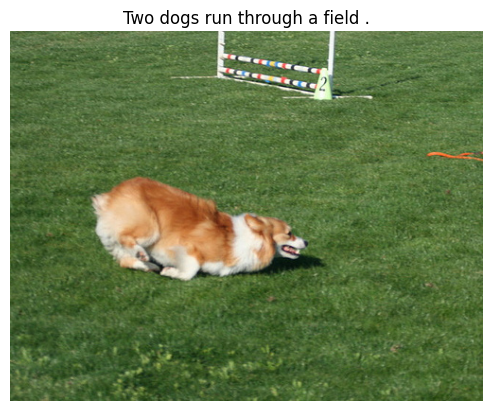

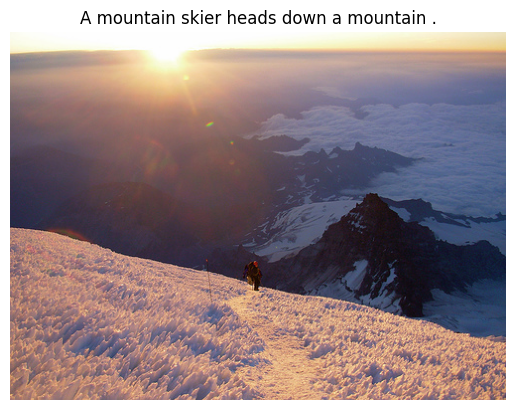

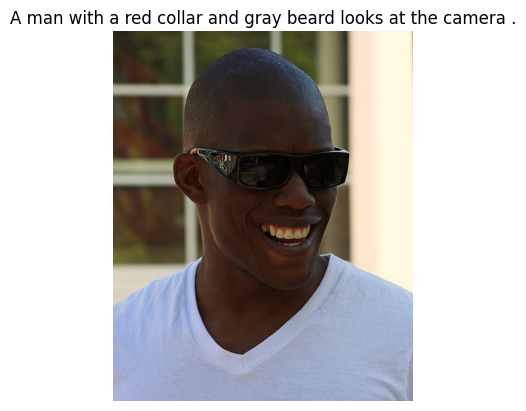

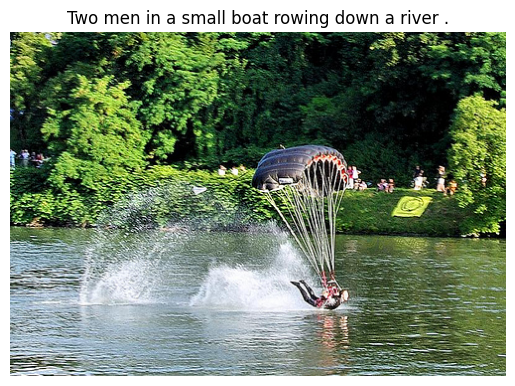

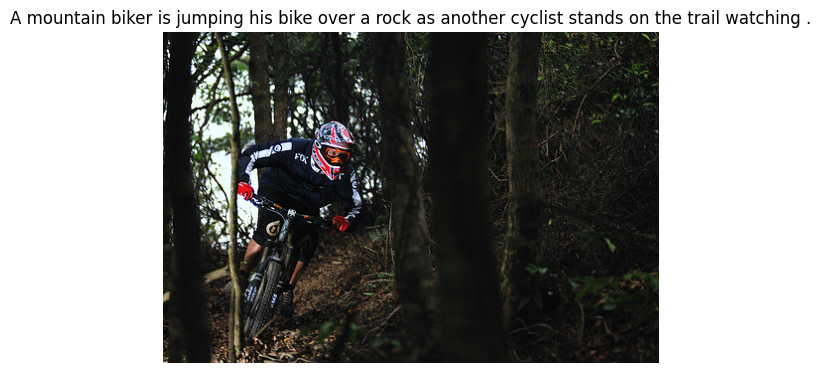

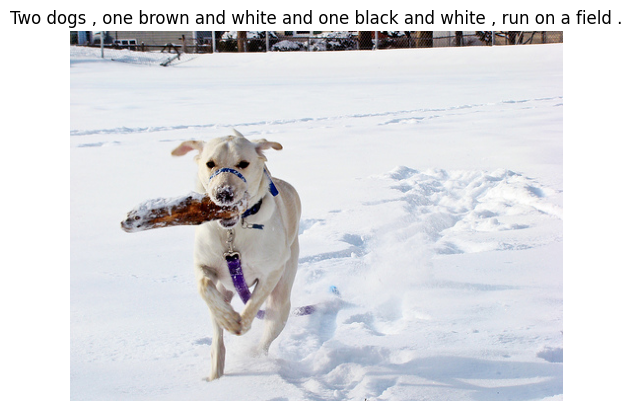

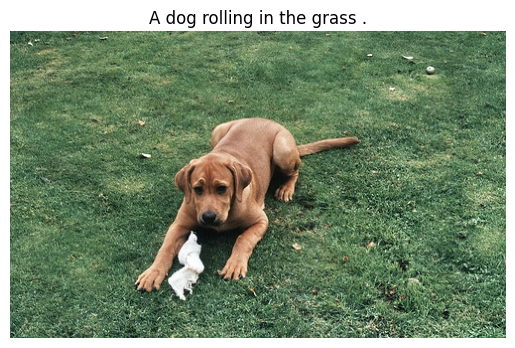

In [ ]:
contradicting_experts_voices = experts_df.query ('abs(mean - 0.5) < 0.1')
show_img_examples(contradicting_experts_voices, 10, train_df)

Противоречивые оценки краудсорсеров:

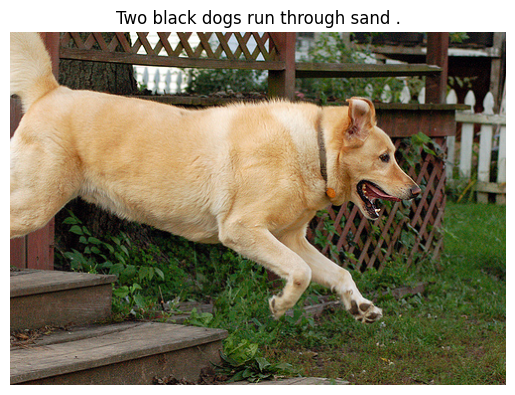

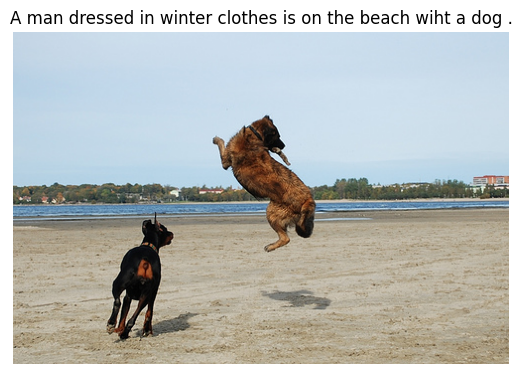

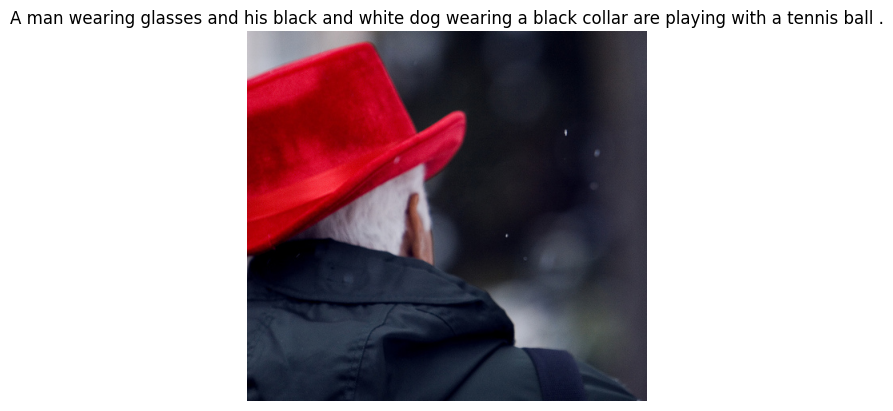

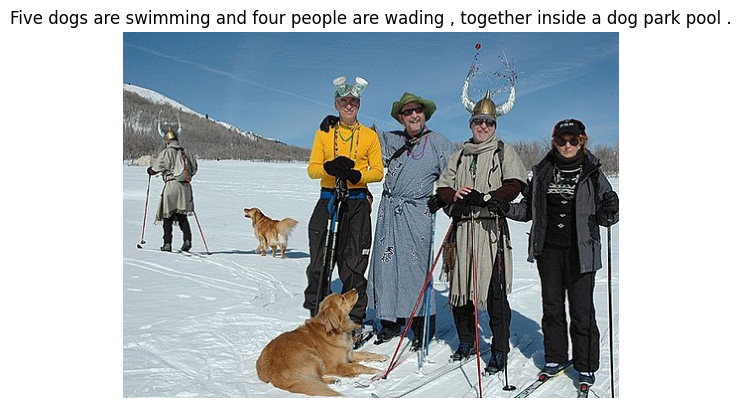

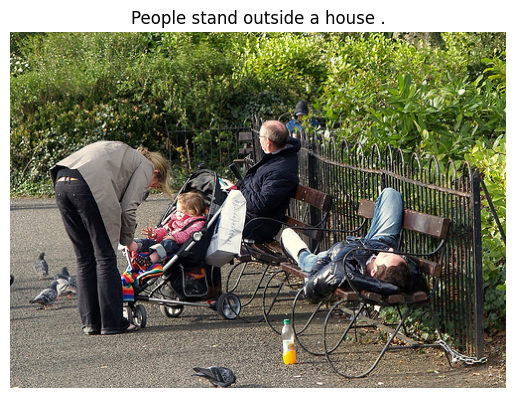

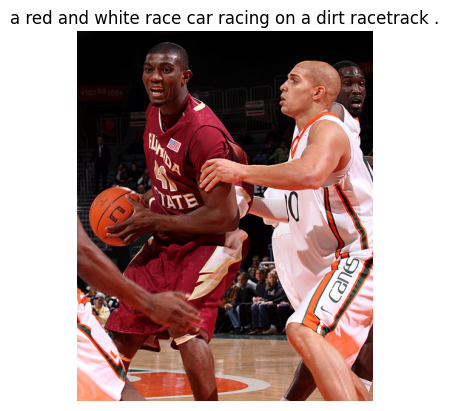

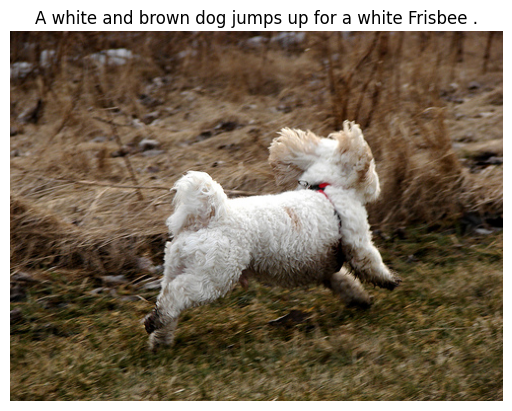

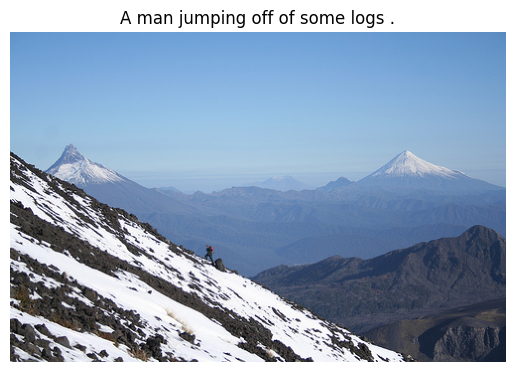

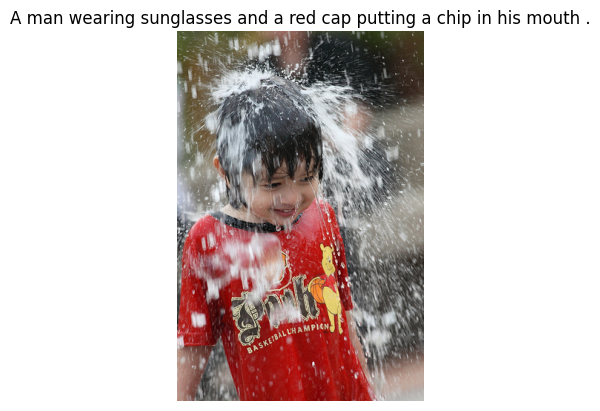

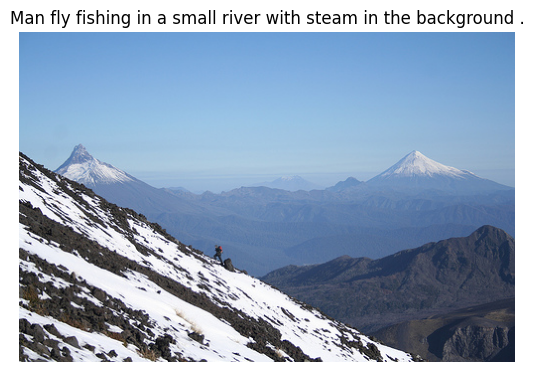

In [ ]:
contradicting_crowd_voices = crowd_df.query ('incorrect_cnt >= 4 and incorrect_cnt >= 4')
show_img_examples(contradicting_crowd_voices, 10, train_df)

- у краудсорсеров при неуверенных ответах получилось 9 ошибок из 10.

Таким образом, краудсорсеры в противоречивых случаях ошибались вдвое чаще, чем эксперты.

Поэтому для уверенных случаях (согласно параметрам выше) будем одинаково доверять оценкам экспертов и краудсорсеров. А в остальных случаях будем оценке краудсорсера доверять в 2, а лучше в 3 раза меньше, чем оценке эксперта.

### Выводы по итогам исследования таблиц
- Степень соответствия текстов и картинок мы берём из оценок экспертов/crowd в CrowdAnnotations.tsv и ExpertAnnotations.tsv. Из файла train_dataset.csv мы берём соответствие идентификатора описания и текста описания (словарь). Поле же image в train_dataset.csv видится как избыточное. Нужно удалить его.
    - в целом не понятно, для чего такая структура задана в таблице train_dataset.csv - зачем столько повторов текста со всеми подряд картинками
- в поле query_id (пример: 2549968784_39bfbe44f9.jpg#2) - указан файл и правильный текст. Это не стоит использовать при обучении, но эта информация может пригодиться для очистки картинок про детей.
что касается файла test_queries.csv - не понятно, зачем в нём указаны столбцы query_id и image - это нам никак не пригодится
- Количество уникальных изображений в обучающем наборе: 977
- Количество уникальных изображений в тестовом наборе: 100
- Количество уникальных запросов в обучающем наборе:  977
- Количество уникальных запросов в тестовом наборе:  500
- Количество оценок в экспертном наборе: 17466
- Количество оценок в краудсорсинговом наборах: 95660
- Из гистограммы распределения оценок экспертов видно, что лишь 5% оценок самое точное описание (оценка 4). 56% имеет очень плохое описание (оценка 1). Это говорит о том, что **качество соответствия подписей картинкам - невысокое**.
- Из гистограммы распределения оценок краудсорсеров  видно, что наиболее частая ситуация - три голоса отдано за оценку как некорректную. Это также говорит о том, что **качество соответствия подписей картинкам - невысокое**.
- Диапазон среднего [0.4,0.6] наиболее надёжно отделяет неверные оценки экспертов.
- Дисперсия выше 0.9 - наиболее надёжно отделяет неверные оценки экспертов.
- Параметры (выбранные логически), при которых оценки краудсорсеров себя показали достаточно надёжно:
    - `confident_experts_voices_pos = experts_df.query ('expert_1>=3 and expert_2>=3 and expert_3>=3')`
    - `confident_experts_voices_neg = experts_df.query ('expert_1<=2 and expert_2<=2 and expert_3<=2')`
    - `confident_crowd_voices_pos = crowd_df.query ('correct_cnt>=3 and incorrect_cnt<=1')`
    - `confident_crowd_voices_neg = crowd_df.query ('incorrect_cnt>=3 and correct_cnt<=1')`
- **Для уверенных случаях (согласно параметрам выше) будем одинаково доверять оценкам экспертов и краудсорсеров. А в остальных случаях будем оценке краудсорсера доверять в 2, а лучше в 3 раза меньше, чем оценке краудсорсера.**

### Трансформация таблиц

#### train_dataset.csv

Проверим, нет ли таких ситуаций, когда одному идентификатору соответствуют два и более разных текстов:

In [ ]:
tmp = train_df[['query_id', 'query_text']].groupby('query_id').nunique()
tmp[tmp['query_text']>1]

,query_text
query_id,


-- всё в порядке, таких неоднозначностей нет.

Как показано выше - столбец image избыточен, он будет удалён:

In [ ]:
train_df = train_df.drop (columns=['image'])

И удалим дубликаты. Получится словарь идентификаторов-vs-текстов описаний.

In [ ]:
display(train_df.shape)
queries_df = train_df.drop_duplicates(subset=['query_id', 'query_text'], ignore_index=True)
display(queries_df.shape)

(5822, 2)

(977, 2)

In [ ]:
queries_df.head()

,query_id,query_text
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...
2,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
3,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...
4,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .


#### CrowdAnnotations.tsv

Удалим противоречивые оценки (также опираясь на логические эвристики):

In [ ]:
crowd_df.shape

(47830, 5)

In [ ]:
crowd_df = crowd_df.query ('not (correct_cnt >= 3 and incorrect_cnt >= 3 )')

In [ ]:
crowd_df.shape

(47829, 5)

In [ ]:
crowd_df.head(3)

,image,query_id,portion,correct_cnt,incorrect_cnt
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3


#### ExpertAnnotations.tsv

Удалим слишком противоречивые оценки

In [ ]:
experts_df.shape

(5822, 6)

In [ ]:
experts_df = experts_df.query ('abs(mean - 0.5) >= 0.1')
experts_df.shape

(5305, 6)

теперь можно усреднить экспертные оценки и удалить лишние столбцы:

In [ ]:
experts_df['mean'].describe()

,mean
count,5305.000000
mean,0.189570
std,0.266788
min,0.000000
25%,0.000000
50%,0.111111
75%,0.222222
max,1.000000


In [ ]:
crowd_df['portion'].describe()

,portion
count,47829.000000
mean,0.068777
std,0.207525
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


- нужные нам поля находятся в  нужном диапазоне [0,1] - это хорошо

#### сконструируем train dataset

Проверим, есть ли повторяющиеся сочетания 'image'+'query_id'?

In [ ]:
tmp = experts_df.copy()
tmp['a'] = tmp['image'] + tmp['query_id']
tmp2 = tmp['a'].value_counts()
tmp2[tmp2>1]

,count
a,


-- в experts_df таких нет, все сочетания уникальны

In [ ]:
tmp = crowd_df.copy()
tmp['a'] = tmp['image'] + tmp['query_id']
tmp2 = tmp['a'].value_counts()
tmp2[tmp2>1]

,count
a,


-- в crowd_df таких нет, все сочетания уникальны

In [ ]:
experts_df.shape

(5305, 6)

In [ ]:
crowd_df.shape

(47829, 5)

In [ ]:
train_df = experts_df.merge(crowd_df, on=['image', 'query_id'], how="outer") #v1 убрал .fillna(0)
train_df.head()

,image,query_id,expert_1,expert_2,expert_3,mean,portion,correct_cnt,incorrect_cnt
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,NaN,1.0,3.0,0.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0


Будем придерживаться логики:
* Если есть только оценка экспертов, мы должны использовать ее.
* Если есть только оценка краудсорсеров, мы должны использовать ее.
* Если есть обе — тогда мы их комбинируем (по правилам описанным в выводах EDA)

Посмотрим на распределение теперь:

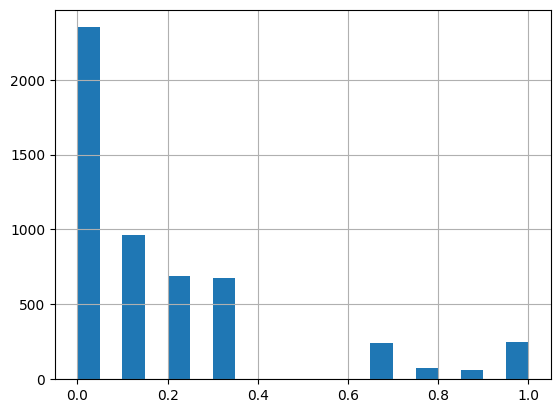

In [ ]:
train_df['mean'].hist(bins=20);

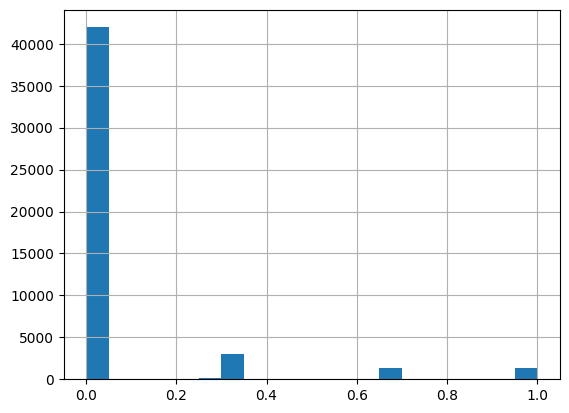

In [ ]:
train_df['portion'].hist(bins=20);

Распределения не идентичны, но похожи в том, что имеют сильный пик около нуля.

In [ ]:
train_df.shape

(51209, 9)

In [ ]:
train_df[train_df['portion'].isna() & train_df['mean'].isna()]

,image,query_id,expert_1,expert_2,expert_3,mean,portion,correct_cnt,incorrect_cnt


Подписей без оценок и экспертов, и краудсорсеров - нет, это хорошо.

In [ ]:
train_df.loc[train_df['portion'].isna(), 'score'] = train_df['mean']

In [ ]:
train_df.loc[train_df['mean'].isna(), 'score'] = train_df['portion']

In [ ]:
train_df.loc[(train_df['expert_1']>=3) & (train_df['expert_2']>=3) & \
              (train_df['expert_3']>=3) & train_df['score'].isna(), 'score'] \
                = train_df['mean']

In [ ]:
train_df.loc[(train_df['expert_1']<=2) & (train_df['expert_2']<=2) & \
              (train_df['expert_3']<=2) & train_df['score'].isna(), 'score'] \
                = train_df['mean']

In [ ]:
train_df.loc[(train_df['correct_cnt']>=3) & (train_df['incorrect_cnt']<=1) & \
              train_df['score'].isna(), 'score'] = train_df['portion']

In [ ]:
train_df.loc[(train_df['incorrect_cnt']>=3) & (train_df['correct_cnt']<=1) & \
              train_df['score'].isna(), 'score'] = train_df['portion']

In [ ]:
train_df.loc[train_df['score'].isna(), 'score'] = \
    (train_df['portion'] / 3 + train_df['mean'] ) / 2

In [ ]:
train_df.shape

(51209, 10)

In [ ]:
train_df.head()

,image,query_id,expert_1,expert_2,expert_3,mean,portion,correct_cnt,incorrect_cnt,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,NaN,1.0,3.0,0.0,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,NaN,NaN,NaN,0.0,0.0,3.0,0.0


In [ ]:
train_df = train_df.drop(columns=['expert_1','expert_2','expert_3','portion','mean','correct_cnt', 'incorrect_cnt'])

In [ ]:
train_df.head()

,image,query_id,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0


посмотрим на распределение score:

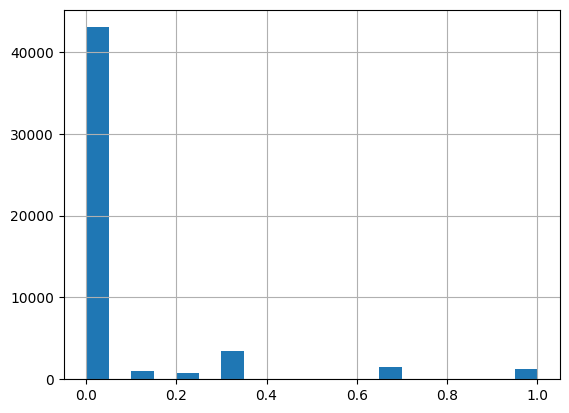

In [ ]:
train_df['score'].hist(bins=20);

Распределение похоже на прежние.

In [ ]:
train_df.shape

(51209, 3)

Нам бесполезны картинки без подписей, поэтому используем inner:

In [ ]:
train_df = train_df.merge (queries_df, on='query_id', how='inner')
train_df.head()

,image,query_id,score,query_text
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,"A woman is signaling is to traffic , as seen f..."
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,A boy in glasses is wearing a red shirt .
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,A young boy holds onto a blue handle on a pier .
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,"A woman wearing black clothes , a purple scarf..."
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,An older woman with blond hair rides a bicycle...


## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [ ]:
# претренированных классификаторов не нашлось, позаимствовал регулярку у chatgpt
kids_pattern = r"\b(child|children|kid|kids|baby|babies|infant|infants|toddler" \
                r"|toddlers|teen|teens|teenager|teenagers|youth|youths|minor"\
                r"|minors|newborn|newborns|preschooler|preschoolers"\
                r"|kindergartener|kindergarteners|schoolchild|schoolchildren"\
                r"|adolescent|adolescents|boy|boys|girl|girls|son|sons|daughter"\
                r"|daughters|kiddo|kiddos|youngster|youngsters|juvenile"\
                r"|juveniles|little one|little ones|family|mother|father)\b"

kids_df = train_df[train_df["query_text"].str.contains(kids_pattern, case=False, regex=True)].copy()

/tmp/ipython-input-4131204042.py:10: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  kids_df = train_df[train_df["query_text"].str.contains(kids_pattern, case=False, regex=True)].copy()


Также найдём имена файлов, которые содержат изображения детей

In [ ]:
kids_image_list = kids_df['query_id'].apply(lambda x: x[:-2]).to_list()
len(kids_image_list)

14382

In [ ]:
train_df.shape

(50100, 4)

In [ ]:
train_df = train_df.drop(kids_df.index)

In [ ]:
train_df.shape

(35718, 4)

In [ ]:
train_df = train_df[~train_df['image'].isin(kids_image_list)]

In [ ]:
train_df.shape

(28840, 4)

In [ ]:
train_df = train_df.drop(columns=['query_id'])

Было удалено много строк, из 51256 осталось 28840.

In [ ]:
if DATASET_LIMIT != 0:
    train_df = train_df [:DATASET_LIMIT]

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Используемое устройство:", device)

Используемое устройство: cuda


In [ ]:
resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
embedding_model_img = nn.Sequential(*list(resnet.children())[:-1])  # уберём последний слой классификации
embedding_model_img.to(device)
embedding_model_img.eval()

img_preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 65.2MB/s]


In [ ]:
class ImageDataset(Dataset):
    def __init__(self, df, img_dir, transform):
        self.df = df
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, row["image"])
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, row["image"]

In [ ]:
def add_img_emb(df, folder, img_preprocess, device):
    dataset = ImageDataset(df, folder, transform=img_preprocess)
    loader = DataLoader(dataset, batch_size=16, shuffle=False)

    img_embs = []
    with torch.no_grad():
        for imgs, names in tqdm(loader, desc="Извлечение эмбеддингов картинок"):
            imgs = imgs.to(device)
            emb = embedding_model_img(imgs)
            emb = emb.flatten(1)
            img_embs.append(emb.cpu())

    img_embs = torch.cat(img_embs, dim=0).numpy()

    df["img_emb"] = list(img_embs)
    return df

In [ ]:
unique_train_df = train_df.drop_duplicates(subset=['image'], ignore_index=True)

In [ ]:
unique_train_df = add_img_emb(unique_train_df, os.path.join(DATA_PATH, 'train_images/'), img_preprocess, device)

Извлечение эмбеддингов картинок: 100%|██████████| 45/45 [00:12<00:00,  3.51it/s]
/tmp/ipython-input-2332595108.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["img_emb"] = list(img_embs)


In [ ]:
unique_train_df

,image,score,query_text,img_emb
0,1056338697_4f7d7ce270.jpg,1.000000,"A woman is signaling is to traffic , as seen f...","[0.02304261, 0.92084557, 0.03865006, 0.8582573..."
1,1082379191_ec1e53f996.jpg,0.000000,A man walks toward a car in a parking lot .,"[0.043088604, 0.66013926, 0.13905267, 1.410013..."
2,1084040636_97d9633581.jpg,1.000000,A white dog has its head on the ground .,"[0.7466349, 0.51160264, 0.4753373, 0.23077312,..."
3,1107246521_d16a476380.jpg,0.666667,A black dog pounces to get a rope toy .,"[0.45615393, 0.13630952, 0.101586126, 0.854812..."
4,1119015538_e8e796281e.jpg,0.000000,A white dog has its head on the ground .,"[0.37238133, 0.70540136, 0.67356545, 0.8074928..."
...,...,...,...,...
702,909808296_23c427022d.jpg,0.000000,A black dog pounces to get a rope toy .,"[0.3992637, 0.5591439, 0.9209326, 0.35464355, ..."
703,925491651_57df3a5b36.jpg,0.000000,A furry dog attempts to dry itself by shaking ...,"[0.15208963, 0.15048958, 0.23516771, 0.2013557..."
704,929679367_ff8c7df2ee.jpg,0.000000,A white dog has its head on the ground .,"[0.19873743, 0.90317446, 1.9932755, 0.21059746..."
705,96420612_feb18fc6c6.jpg,0.000000,A man jumps while snow skiing .,"[0.08363269, 1.8207562, 0.14734481, 0.34819576..."


In [ ]:
train_df = train_df.merge(unique_train_df[['image', 'img_emb']], how='left', on='image')

In [ ]:
train_df.head()

,image,score,query_text,img_emb
0,1056338697_4f7d7ce270.jpg,1.0,"A woman is signaling is to traffic , as seen f...","[0.02304261, 0.92084557, 0.03865006, 0.8582573..."
1,1056338697_4f7d7ce270.jpg,0.0,"A woman wearing black clothes , a purple scarf...","[0.02304261, 0.92084557, 0.03865006, 0.8582573..."
2,1056338697_4f7d7ce270.jpg,0.0,An older woman with blond hair rides a bicycle...,"[0.02304261, 0.92084557, 0.03865006, 0.8582573..."
3,1056338697_4f7d7ce270.jpg,0.0,A woman wearing a white glove peers over the c...,"[0.02304261, 0.92084557, 0.03865006, 0.8582573..."
4,1056338697_4f7d7ce270.jpg,0.0,A man taking a picture with a silver camera .,"[0.02304261, 0.92084557, 0.03865006, 0.8582573..."


## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [ ]:
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert = BertModel.from_pretrained("bert-base-uncased")
bert.to(device)
bert.eval()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

In [ ]:
def add_text_emb(df, tokenizer, bert, device):

    # Токенизация с padding и truncation
    encoded_inputs = tokenizer(
        list(df['query_text']),
        padding=True,
        truncation=True,
        max_length=256,
        return_tensors="pt"
    )

    # Переносим тензоры на GPU
    input_ids = encoded_inputs["input_ids"].to(device)
    attention_mask = encoded_inputs["attention_mask"].to(device)

    text_emb = []

    # Прогон по батчам
    batch_size = 128
    n_samples = input_ids.size(0)
    for i in tqdm(range(0, n_samples, batch_size), desc="Computing embeddings"):
        input_ids_batch = input_ids[i:i+batch_size].to(device)
        attention_mask_batch = attention_mask[i:i+batch_size].to(device)

        with torch.no_grad():
            outputs = bert(input_ids=input_ids_batch, attention_mask=attention_mask_batch)
            cls_embeddings = outputs.last_hidden_state[:, 0, :]  # (batch_size, hidden_size)
            text_emb.append(cls_embeddings.cpu())

    # Объединяем
    text_emb = torch.cat(text_emb, dim=0)  # (n_samples, hidden_size)

    text_emb = text_emb.numpy()
    df["text_emb"] = list(text_emb)

    return df

In [ ]:
train_df = add_text_emb(train_df, tokenizer, bert, device)
train_df.head()

Computing embeddings: 100%|██████████| 226/226 [00:52<00:00,  4.33it/s]


,image,score,query_text,img_emb,text_emb
0,1056338697_4f7d7ce270.jpg,1.0,"A woman is signaling is to traffic , as seen f...","[0.02304261, 0.92084557, 0.03865006, 0.8582573...","[0.043843865, 0.107649684, -0.18056081, -0.031..."
1,1056338697_4f7d7ce270.jpg,0.0,"A woman wearing black clothes , a purple scarf...","[0.02304261, 0.92084557, 0.03865006, 0.8582573...","[0.27778742, 0.19995686, -0.56601804, -0.07616..."
2,1056338697_4f7d7ce270.jpg,0.0,An older woman with blond hair rides a bicycle...,"[0.02304261, 0.92084557, 0.03865006, 0.8582573...","[0.37542343, 0.098983884, -0.5950289, -0.21974..."
3,1056338697_4f7d7ce270.jpg,0.0,A woman wearing a white glove peers over the c...,"[0.02304261, 0.92084557, 0.03865006, 0.8582573...","[0.35252148, 0.036249176, -0.35809672, -0.3288..."
4,1056338697_4f7d7ce270.jpg,0.0,A man taking a picture with a silver camera .,"[0.02304261, 0.92084557, 0.03865006, 0.8582573...","[-0.29918575, -0.22425824, -0.58888483, 0.2324..."


In [ ]:
train_df.iloc[0]['text_emb'].shape

(768,)

In [ ]:
train_df.iloc[0]['img_emb'].shape

(2048,)

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [ ]:
def concat_emb (df):
    df['concat_emb'] = list(np.hstack([np.vstack(df["text_emb"]),
                                       np.vstack(df["img_emb"])]))
    df = df.drop(columns=['query_text', 'img_emb', 'text_emb'])
    df = df.reset_index(drop=True)
    df_values = pd.DataFrame(df['concat_emb'].to_list())

    df = df.drop(columns=['concat_emb']).join(df_values)

    return df

In [ ]:
train_df = concat_emb (train_df)
train_df.head()

,image,score,0,1,2,3,4,5,6,7,...,2806,2807,2808,2809,2810,2811,2812,2813,2814,2815
0,1056338697_4f7d7ce270.jpg,1.0,0.043844,0.107650,-0.180561,-0.031212,0.078859,-0.081227,0.442493,0.541437,...,0.037381,0.703045,0.55671,0.375198,1.12293,0.27615,1.187245,0.136031,0.175029,0.255703
1,1056338697_4f7d7ce270.jpg,0.0,0.277787,0.199957,-0.566018,-0.076165,0.026235,-0.466188,0.041918,0.686629,...,0.037381,0.703045,0.55671,0.375198,1.12293,0.27615,1.187245,0.136031,0.175029,0.255703
2,1056338697_4f7d7ce270.jpg,0.0,0.375423,0.098984,-0.595029,-0.219741,0.243599,-0.168164,0.036504,0.614584,...,0.037381,0.703045,0.55671,0.375198,1.12293,0.27615,1.187245,0.136031,0.175029,0.255703
3,1056338697_4f7d7ce270.jpg,0.0,0.352521,0.036249,-0.358097,-0.328876,-0.091208,-0.430766,0.369749,0.483581,...,0.037381,0.703045,0.55671,0.375198,1.12293,0.27615,1.187245,0.136031,0.175029,0.255703
4,1056338697_4f7d7ce270.jpg,0.0,-0.299186,-0.224258,-0.588885,0.232488,-0.244471,-0.090154,-0.187987,0.832043,...,0.037381,0.703045,0.55671,0.375198,1.12293,0.27615,1.187245,0.136031,0.175029,0.255703


## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [ ]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RANDOM_STATE)
train_indices, test_indices = next(gss.split(X=train_df.drop(columns=['score']),
                                             y=train_df['score'],
                                             groups=train_df['image']))
train_part, val_part = train_df.loc[train_indices], train_df.loc[test_indices]

In [ ]:
train_part = train_part.drop(columns=['image'])
val_part = val_part.drop(columns=['image'])

In [ ]:
X_train = train_part.drop(['score'], axis=1)
y_train = train_part['score']
X_test = val_part.drop(['score'], axis=1)
y_test = val_part['score']

согласно заданию, рассмортрим
1. Линейную регрессию (она войдёт в соревнование с другими классическими моделями)
2. Полносвязные нейронные сети.

### Классические модели

In [ ]:
%%time
model = LinearRegression()
model.fit(X_train, y_train)
preds = model.predict(X_test)
rmse = mean_squared_error(y_test, preds)**0.5
display (f"rmse on test is: {rmse}")

'rmse on test is: 0.2332956440942605'

CPU times: user 23.9 s, sys: 171 ms, total: 24.1 s
Wall time: 14.6 s


### Нейросеть

In [ ]:
X_train_t = torch.tensor(X_train.values, dtype=torch.float32)
y_train_t = torch.tensor(y_train.values, dtype=torch.float32).unsqueeze(1)

X_test_t = torch.tensor(X_test.values, dtype=torch.float32)
y_test_t = torch.tensor(y_test.values, dtype=torch.float32).unsqueeze(1)

train_dataset = TensorDataset(X_train_t, y_train_t)
train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True)

test_dataset = TensorDataset(X_test_t, y_test_t)
test_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

In [ ]:
class MLPRegressor(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, 1)  # регрессия
        )
    def forward(self, x):
        return self.model(x)

input_dim = X_train.shape[1]
mlp = MLPRegressor(input_dim).to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(mlp.parameters(), lr=1e-5)

In [ ]:
%%time
num_epochs = 500
patience = 10  # сколько эпох ждём улучшения
best_rmse = float('inf')
counter = 0

for epoch in range(num_epochs):
    mlp.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        pred = mlp(xb)
        loss = criterion(pred, yb)
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    # Тестовая ошибка
    mlp.eval()
    y_pred_list = []
    with torch.no_grad():
        for xb, _ in test_loader:
            xb = xb.to(device)
            y_pred_list.append(mlp(xb).cpu())
    y_pred = torch.cat(y_pred_list).numpy()
    rmse = mean_squared_error(y_test, y_pred)**0.5

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {np.mean(train_losses):.4f}, Test RMSE: {rmse:.4f}")

    # --- ранняя остановка ---
    if rmse < best_rmse:
        best_rmse = rmse
        counter = 0
        best_model_state = mlp.state_dict()  # сохраняем лучшую модель
    else:
        counter += 1
        if counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            mlp.load_state_dict(best_model_state)  # возвращаем лучшую модель
            break

Epoch 1/500, Train Loss: 0.3671, Test RMSE: 0.2724
Epoch 2/500, Train Loss: 0.3431, Test RMSE: 0.3047
Epoch 3/500, Train Loss: 0.3320, Test RMSE: 0.3161
Epoch 4/500, Train Loss: 0.3229, Test RMSE: 0.3122
Epoch 5/500, Train Loss: 0.3129, Test RMSE: 0.3019
Epoch 6/500, Train Loss: 0.3055, Test RMSE: 0.2953
Epoch 7/500, Train Loss: 0.2957, Test RMSE: 0.2907
Epoch 8/500, Train Loss: 0.2897, Test RMSE: 0.2915
Epoch 9/500, Train Loss: 0.2872, Test RMSE: 0.2869
Epoch 10/500, Train Loss: 0.2804, Test RMSE: 0.2829
Epoch 11/500, Train Loss: 0.2797, Test RMSE: 0.2789
Early stopping at epoch 11
CPU times: user 23 s, sys: 75.9 ms, total: 23.1 s
Wall time: 23.2 s


Вывод - у MLP RMSE чуть лучше.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [ ]:
test_queries_df = test_queries_df.sample(10)

In [ ]:
test_queries_df = pd.DataFrame ({'query_text': test_queries_df['query_text']})

In [ ]:
test_queries_df = add_text_emb(test_queries_df, tokenizer, bert, device)
test_queries_df.head()

Computing embeddings: 100%|██████████| 1/1 [00:00<00:00, 47.81it/s]


,query_text,text_emb
445,A man and two boys standing in spraying water .,"[-0.20757699, 0.43106973, -0.70491725, 0.13937..."
426,Two small white dogs chasing after a red ball .,"[-0.20836914, -0.20541655, -0.86921525, 0.1381..."
275,A dog in a harness pulling a pink carrier behi...,"[-0.4779697, -0.1593056, -0.9648921, 0.2468070..."
462,A Yorkie trying to catch a red toy .,"[-0.5618013, -0.5705333, -1.003253, -0.1028512..."
288,A large bird spreading his wings in flight ove...,"[-0.10344885, -0.12168088, -0.5834354, 0.35855..."


In [ ]:
test_images_df = add_img_emb(test_images_df, os.path.join(DATA_PATH, 'test_images/'), img_preprocess, device)
test_images_df.head()

Извлечение эмбеддингов картинок: 100%|██████████| 7/7 [00:01<00:00,  5.41it/s]


,image,img_emb
0,3356748019_2251399314.jpg,"[0.12652047, 0.7922101, 0.18116361, 0.06266144..."
1,2887171449_f54a2b9f39.jpg,"[0.4705628, 1.1251985, 1.8175066, 0.1955309, 1..."
2,3089107423_81a24eaf18.jpg,"[0.097898014, 0.35717854, 0.29196146, 0.959665..."
3,1429546659_44cb09cbe2.jpg,"[0.23198014, 0.69256616, 0.8059879, 0.04265272..."
4,1177994172_10d143cb8d.jpg,"[0.514277, 1.3942043, 0.39647636, 0.48633462, ..."


In [ ]:
KIDS_DISCLAIMER = 'This image is unavailable in your country in compliance with local laws'

def get_image_by_text (text, test_images_df):
    if re.search(kids_pattern, text, re.IGNORECASE):
        return KIDS_DISCLAIMER, 0

    text_embs = [row["text_emb"].copy() for _ in range(test_images_df.shape[0])]
    X_inference = np.hstack([
        np.vstack(text_embs),
        np.vstack(test_images_df["img_emb"])
    ])

    X_inference_t = torch.tensor(X_inference, dtype=torch.float32).to(device)
    mlp.eval()
    with torch.no_grad():
        y_inference_pred = mlp(X_inference_t).cpu().numpy()

    best_match_idx = np.argmax(y_inference_pred)
    best_image_row = test_images_df.iloc[best_match_idx]

    return  test_images_df.iloc[best_match_idx]['image'], \
            y_inference_pred[best_match_idx][0]


'This image is unavailable in your country in compliance with local laws'

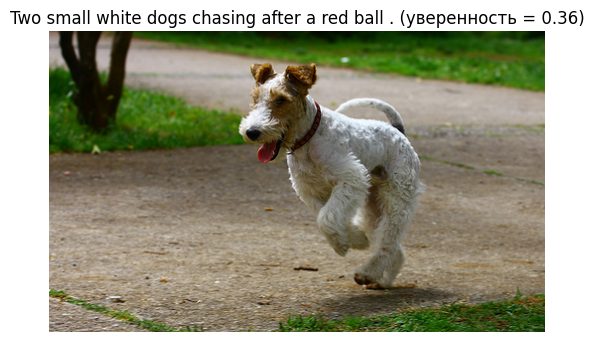

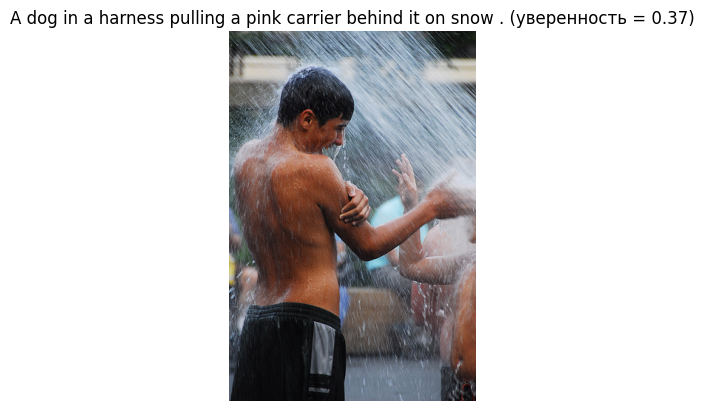

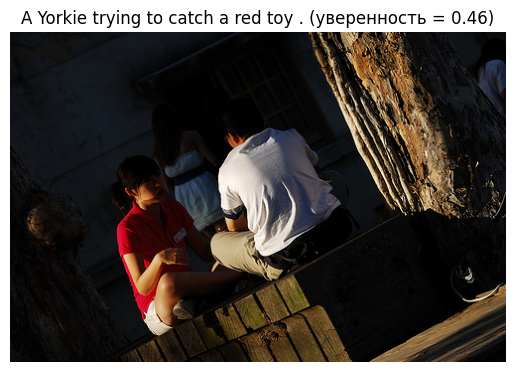

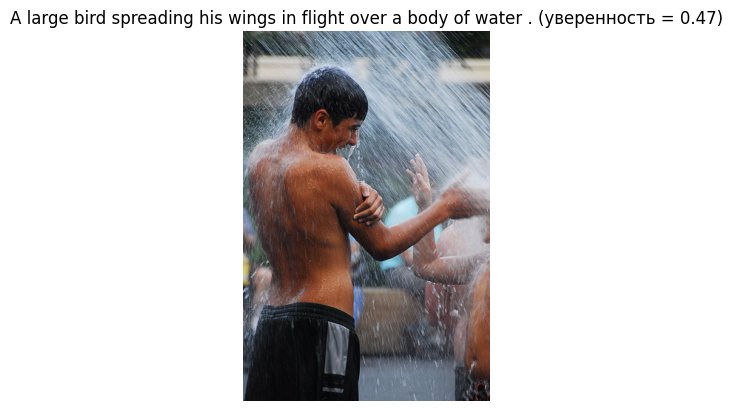

'This image is unavailable in your country in compliance with local laws'

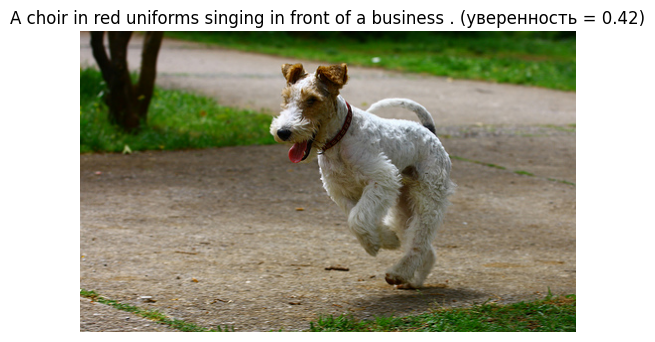

'This image is unavailable in your country in compliance with local laws'

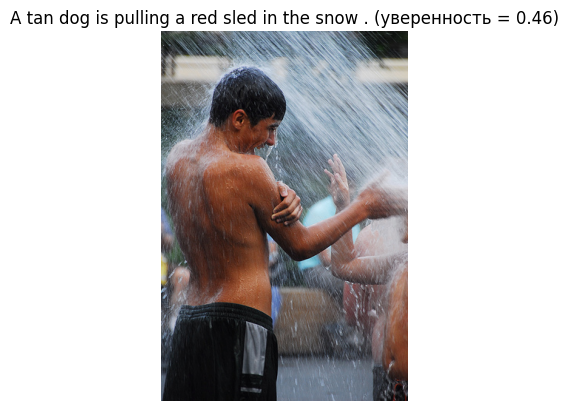

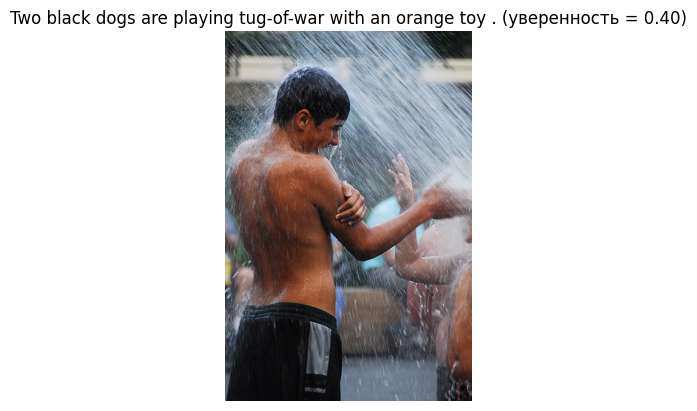

In [ ]:
i=1
for _, row in test_queries_df.iterrows():
    query = row['query_text']
    image_name, prob = get_image_by_text (query, test_images_df)
    if image_name == KIDS_DISCLAIMER:
        display (KIDS_DISCLAIMER)
        continue
    img = Image.open(os.path.join(DATA_PATH, 'test_images/', image_name))
    plt.imshow(img)
    plt.axis('off')  # отключаем оси
    plt.title(f"{query} (уверенность = {prob:.2f})")
    plt.show()

## 8. Выводы


- В соответствии с поставленной задачей(см. первый раздел)
    - была проведена подготовка данных и их разведочный анализ, в результате которых:
        - были удалены противоречивая разметка экспертов и crowd
    - были построены эмбеддинги для текстов (bert-base-uncased) и изображений (resnet50) - их конкатенация была выбрана в качестве признака X
    - был придуман и реализован принцип согласования голосов экспертов и crowd (нормирован от 0 до 1) - он был выбран в качестве целевого признака (задача регрессии)
    - в качестве метрики был выбран rmse
    - была натренирована модель логистической регрессии (также пробовал деревянные модели и- но они слишком долго обучались, пришлось отказаться), на также полносвязная нейросеть
        - нейросеть показала более хороший rmse на тестовой выборке, поэтому итоговый выбор пал на неё
    - был проведён тест на тестовой выборке и визуальная оценка результатов
    - вывод: текущее качество поиска изображения по тексту - оставляет желать лучшего и нуждается в дальнейшем усовершенствовании